# R2 Position Extraction Mechanism Analysis

This notebook follows the plan in `/.claude/plans/silly-dancing-abelson.md`.
Goal: explain how fixed Block 2 attention weights can extract position from frozen Block 1 outputs.

Hypotheses covered:
- H1: Embedding projection features correlate with position
- H2: A decoding vector built from LN(embeddings) predicts position
- H3: Block 2 attention patterns and key directions expose structural averaging
- H4: Value-space projection isolates position-sensitive subspace


In [1]:
# https://wandb.ai/matan_avitan/nope-2layer-mechanism/runs/ff0hgn5g

In [2]:
# =========================
# Plotting utilities
# =========================

from pathlib import Path
from datetime import datetime
import plotly.express as px
import plotly.graph_objects as go
from transformer_lens.utils import to_numpy

# 📁 Create plots folder (script-safe + notebook-safe)
try:
    BASE_DIR = Path(__file__).resolve().parent
except NameError:
    BASE_DIR = Path.cwd()

PLOTS_DIR = BASE_DIR / "overleaf" / "nopos_icml_2026" / "plots"
PLOTS_DIR.mkdir(parents=True, exist_ok=True)
def _safe_filename(title: str, fallback: str):
    if title:
        return title.lower().replace(" ", "_").replace("/", "_")
    return fallback
def line(
    tensor,
    line_labels=None,
    yaxis="",
    xaxis="",
    title="",
    legend_title="",
    show_legend=False,
    export=False,
    file_name=None,
    save_png=True,
    save_pdf=False,
    save_svg=False,
    save_html=False,
    dpi=300,
    **kwargs,
):
    tensor = to_numpy(tensor)

    fig = px.line(tensor, template="plotly_white", **kwargs)

    fig.update_layout(
        title=dict(text=title, font=dict(size=24, family="Serif")),
        xaxis=dict(title=xaxis, title_font=dict(size=18), tickfont=dict(size=16)),
        yaxis=dict(title=yaxis, title_font=dict(size=18), tickfont=dict(size=16)),
        legend=dict(title=legend_title, font=dict(size=16)),
        showlegend=show_legend,
        width=800,
        height=500,
        margin=dict(l=50, r=50, t=80, b=50),
    )

    for trace in fig.data:
        trace.line.width = 3
        trace.marker = dict(symbol="circle", size=8)
        trace.showlegend = show_legend

    if line_labels:
        for i, label in enumerate(line_labels):
            fig.data[i].name = label

    # =========================
    # Export
    # =========================
    if export:
        if file_name:
            base = PLOTS_DIR / file_name
        else:
            fname = _safe_filename(title, "line_plot")
            timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
            base = PLOTS_DIR / f"{fname}_{timestamp}"

        if save_png:
            fig.write_image(f"{base}.png", scale=dpi / 100)
        if save_pdf:
            fig.write_image(f"{base}.pdf")
        if save_svg:
            fig.write_image(f"{base}.svg")
        if save_html:
            fig.write_html(f"{base}.html")

    fig.show()
def imshow(
    tensor,
    yaxis="",
    xaxis="",
    title="Image",
    export=False,
    file_name=None,
    save_png=True,
    save_pdf=False,
    save_svg=False,
    save_html=False,
    dpi=300,
    col_markers=None,
    **kwargs,
):
    tensor = to_numpy(tensor)

    fig = px.imshow(
        tensor,
        color_continuous_scale="RdBu_r",
        color_continuous_midpoint=0.0,
        labels={"x": xaxis, "y": yaxis},
        template="plotly_white",
        aspect="equal",
        **kwargs,
    )

    fig.update_layout(
        title=dict(text=title, font=dict(size=24, family="Serif")),
        xaxis=dict(title=xaxis, title_font=dict(size=18), tickfont=dict(size=16)),
        yaxis=dict(title=yaxis, title_font=dict(size=18), tickfont=dict(size=16)),
        width=800,
        height=600,
        margin=dict(l=50, r=50, t=80, b=50),
    )

    if col_markers:
        y_marker = -0.6
        for item in col_markers:
            if isinstance(item, (int, float)):
                x, label, color = item, None, '#C44E52'
            else:
                x, label, color = item
            fig.add_trace(
                go.Scatter(
                    x=[x],
                    y=[y_marker],
                    mode='markers',
                    marker=dict(
                        symbol='triangle-down',
                        size=10,
                        color=color,
                        line=dict(color='black', width=0.5),
                    ),
                    showlegend=False,
                    cliponaxis=False,
                )
            )
            if label:
                fig.add_annotation(
                    x=x,
                    y=y_marker - 0.9,
                    text=label,
                    showarrow=False,
                    font=dict(size=12, color=color),
                )
        fig.update_yaxes(range=[tensor.shape[0] - 0.5, -2.2])

    # =========================
    # Export
    # =========================
    if export:
        if file_name:
            base = PLOTS_DIR / file_name
        else:
            fname = _safe_filename(title, "imshow")
            timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
            base = PLOTS_DIR / f"{fname}_{timestamp}"

        if save_png:
            fig.write_image(f"{base}.png", scale=dpi / 100)
        if save_pdf:
            fig.write_image(f"{base}.pdf")
        if save_svg:
            fig.write_image(f"{base}.svg")
        if save_html:
            fig.write_html(f"{base}.html")

    fig.show()

In [3]:
import sys
from pathlib import Path
from typing import Dict, List, Tuple

import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

torch.manual_seed(42)
np.random.seed(42)

device = "cuda" if torch.cuda.is_available() else "cpu"
BOS_TOKEN_ID = 50256

def find_repo_root(start: Path) -> Path:
    """Find repo root by locating nanoGPT directory."""
    for parent in [start] + list(start.parents):
        if (parent / "nanoGPT").exists():
            return parent
    raise FileNotFoundError("Could not locate repo root containing nanoGPT/")

ROOT_DIR = find_repo_root(Path.cwd())
NANOGPT_DIR = ROOT_DIR / "nanoGPT"
sys.path.insert(0, str(NANOGPT_DIR))

from model_2layer_mechanism import TwoLayerMechanismModel, TwoLayerMechanismConfig

CHECKPOINT_PATH = ROOT_DIR / "nanoGPT/out-2layer-mechanism-r2-1head-postattn/R2/ff0hgn5g/best_ckpt.pt"
DATA_DIR = ROOT_DIR / "nanoGPT/data/openwebtext"

BATCH_SIZE = 32
VOCAB_SAMPLE_SIZE = 4096

print(f"Device: {device}")
print(f"Repo root: {ROOT_DIR}")
print(f"Checkpoint: {CHECKPOINT_PATH}")
print(f"BOS token id: {BOS_TOKEN_ID} (inserted at position 0)")


Device: cuda
Repo root: /home/nlp/matan_avitan/git/nopos_locating_new
Checkpoint: /home/nlp/matan_avitan/git/nopos_locating_new/nanoGPT/out-2layer-mechanism-r2-1head-postattn/R2/ff0hgn5g/best_ckpt.pt
BOS token id: 50256 (inserted at position 0)


In [4]:
def load_r2_model(checkpoint_path: Path, device: str) -> TwoLayerMechanismModel:
    """Load R2 checkpoint into TwoLayerMechanismModel."""
    if not checkpoint_path.exists():
        raise FileNotFoundError(f"Checkpoint not found: {checkpoint_path}")
    checkpoint = torch.load(str(checkpoint_path), map_location=device, weights_only=False)
    config_dict = checkpoint["config"]
    config_fields = ["block_size", "vocab_size", "n_embd", "n_head", "dropout", "norm_type"]
    filtered = {k: config_dict[k] for k in config_fields if k in config_dict}
    filtered["bias"] = True
    filtered["use_regression"] = True
    config = TwoLayerMechanismConfig(**filtered)
    model = TwoLayerMechanismModel(config)
    model.set_post_attn_head(True)
    state_dict = {k.replace("_orig_mod.", ""): v for k, v in checkpoint["model"].items()}
    model.load_state_dict(state_dict)
    model.to(device)
    model.eval()
    return model

def load_owt_train_data(data_dir: Path) -> np.ndarray:
    """Load OpenWebText train split."""
    train_path = data_dir / "train.bin"
    if not train_path.exists():
        raise FileNotFoundError(f"Train data not found: {train_path}")
    return np.memmap(str(train_path), dtype=np.uint16, mode="r")

def get_batch(data: np.ndarray, batch_size: int, block_size: int, device: str) -> torch.Tensor:
    """Sample a batch of token sequences with BOS at position 0."""
    tokens_needed = block_size - 1
    ix = torch.randint(len(data) - tokens_needed, (batch_size,))
    sequences = []
    for i in ix:
        i = i.item()
        after_bos = data[i : i + tokens_needed].astype(np.int64)
        seq = np.concatenate([[BOS_TOKEN_ID], after_bos])
        sequences.append(torch.from_numpy(seq))
    x = torch.stack(sequences)
    return x.to(device)

def make_positions(batch_size: int, block_size: int, device: str) -> torch.Tensor:
    """Create position targets [B, T]."""
    return torch.arange(block_size, device=device).unsqueeze(0).repeat(batch_size, 1).float()

def corrcoef(x: torch.Tensor, y: torch.Tensor) -> float:
    """Compute Pearson correlation of flattened tensors."""
    x_flat = x.flatten().float()
    y_flat = y.flatten().float()
    if x_flat.numel() < 2:
        return 0.0
    x_centered = x_flat - x_flat.mean()
    y_centered = y_flat - y_flat.mean()
    denom = x_centered.norm() * y_centered.norm()
    if denom.item() == 0:
        return 0.0
    return (x_centered @ y_centered / denom).item()

def r2_score(preds: torch.Tensor, targets: torch.Tensor) -> float:
    """Compute R^2 for predictions vs targets."""
    preds = preds.flatten().float()
    targets = targets.flatten().float()
    ss_res = ((targets - preds) ** 2).sum()
    ss_tot = ((targets - targets.mean()) ** 2).sum()
    return (1 - ss_res / ss_tot).item() if ss_tot > 0 else 0.0

def linear_fit_r2(X: torch.Tensor, y: torch.Tensor) -> Tuple[float, np.ndarray]:
    """Fit linear regression and return R^2 and weights."""
    X_np = X.detach().cpu().numpy()
    y_np = y.detach().cpu().numpy().reshape(-1)
    if X_np.ndim == 1:
        X_np = X_np.reshape(-1, 1)
    X_aug = np.concatenate([X_np, np.ones((X_np.shape[0], 1))], axis=1)
    w, *_ = np.linalg.lstsq(X_aug, y_np, rcond=None)
    y_hat = X_aug @ w
    ss_res = np.sum((y_np - y_hat) ** 2)
    ss_tot = np.sum((y_np - y_np.mean()) ** 2)
    r2 = 1 - ss_res / ss_tot if ss_tot > 0 else 0.0
    return float(r2), w

def sample_embeddings(embeddings: torch.Tensor, sample_size: int) -> torch.Tensor:
    """Sample embeddings without replacement."""
    vocab_size = embeddings.shape[0]
    sample_size = min(sample_size, vocab_size)
    idx = torch.randperm(vocab_size, device=embeddings.device)[:sample_size]
    return embeddings[idx]

def cosine_similarity_features(r1: torch.Tensor, emb: torch.Tensor, chunk_size: int = 2048) -> torch.Tensor:
    """Compute max/mean/std cosine similarity features for each vector in r1 against emb."""
    r1_flat = r1.reshape(-1, r1.shape[-1])
    emb_norm = F.normalize(emb, dim=-1)
    r1_norm = F.normalize(r1_flat, dim=-1)
    features = []
    for chunk in torch.split(r1_norm, chunk_size):
        sims = chunk @ emb_norm.T
        max_sim = sims.max(dim=-1).values
        mean_sim = sims.mean(dim=-1)
        std_sim = sims.std(dim=-1)
        features.append(torch.stack([max_sim, mean_sim, std_sim], dim=-1))
    return torch.cat(features, dim=0)

def sequence_similarity_features(r1: torch.Tensor, e_seq: torch.Tensor) -> torch.Tensor:
    """Compute max/mean/std similarity to embeddings in the same sequence."""
    sims = torch.einsum("btd,bsd->bts", r1, e_seq)
    max_sim = sims.max(dim=-1).values
    mean_sim = sims.mean(dim=-1)
    std_sim = sims.std(dim=-1)
    return torch.stack([max_sim, mean_sim, std_sim], dim=-1)

@torch.no_grad()
def compute_decoding_vector(model: TwoLayerMechanismModel, chunk_size: int = 4096) -> torch.Tensor:
    """Compute w = sum_v LN(e_v) using Block 2 LN1."""
    E = model.wte.weight.detach()
    w = torch.zeros(E.shape[1], device=E.device)
    for chunk in torch.split(E, chunk_size, dim=0):
        ln_chunk = model.block2.ln_1(chunk)
        w += ln_chunk.sum(dim=0)
    w = w / (w.norm() + 1e-8)
    return w

@torch.no_grad()
def forward_from_r1(
    model: TwoLayerMechanismModel, r1: torch.Tensor
) -> Tuple[torch.Tensor, Dict[str, torch.Tensor]]:
    """Run Block 2 and head starting from r1."""
    ln1 = model.block2.ln_1(r1)
    attn_out = model.block2.attn(ln1)
    post_attn = r1 + attn_out
    ln2 = model.block2.ln_2(post_attn)
    mlp_out = model.block2.mlp(ln2)
    block2_out = post_attn + mlp_out
    x = model.ln_f(block2_out)
    preds = model.pos_head(x).squeeze(-1)
    return preds, {"ln1": ln1, "attn_out": attn_out, "post_attn": post_attn, "block2_out": block2_out}

def prefix_average(x: torch.Tensor) -> torch.Tensor:
    """Compute prefix averages along sequence dimension."""
    cumsum = torch.cumsum(x, dim=1)
    denom = torch.arange(1, x.shape[1] + 1, device=x.device).view(1, -1, 1)
    return cumsum / denom

def summarize_position_signal(name: str, acts: torch.Tensor, positions: torch.Tensor) -> Dict[str, float]:
    """Print norm-position correlation and linear R^2."""
    norms = acts.norm(dim=-1)
    corr = corrcoef(norms, positions)
    r2, _ = linear_fit_r2(norms.flatten(), positions.flatten())
    print(f"{name}: corr(norm,pos)={corr:.4f}, R^2(norm->pos)={r2:.4f}")
    return {"corr": corr, "r2": r2}


In [5]:
model = load_r2_model(CHECKPOINT_PATH, device)
train_data = load_owt_train_data(DATA_DIR)
block_size = model.config.block_size
tokens = get_batch(train_data, BATCH_SIZE, block_size, device)
positions = make_positions(BATCH_SIZE, block_size, device)

with torch.no_grad():
    output, _ = model(tokens, capture_taps=True)
    taps = model.get_all_taps()
    attn1, attn2 = model.get_attention_weights()

D = model.config.n_embd

W_Q1, W_K1, W_V1 = model.block1.attn.c_attn.weight.detach().split(D, dim=0)
b1 = model.block1.attn.c_attn.bias
if b1 is not None:
    b_Q1, b_K1, b_V1 = b1.detach().split(D, dim=0)
else:
    b_Q1 = b_K1 = b_V1 = None
W_O1 = model.block1.attn.c_proj.weight.detach()
b_O1 = model.block1.attn.c_proj.bias.detach() if model.block1.attn.c_proj.bias is not None else None

W_Q2, W_K2, W_V2 = model.block2.attn.c_attn.weight.detach().split(D, dim=0)
b2 = model.block2.attn.c_attn.bias
if b2 is not None:
    b_Q2, b_K2, b_V2 = b2.detach().split(D, dim=0)
else:
    b_Q2 = b_K2 = b_V2 = None
W_O2 = model.block2.attn.c_proj.weight.detach()
b_O2 = model.block2.attn.c_proj.bias.detach() if model.block2.attn.c_proj.bias is not None else None

preds = output.squeeze(-1)
results: Dict[str, float] = {}
results["pred_r2"] = r2_score(preds, positions)

print(f"Pred R^2: {results['pred_r2']:.4f}")
results["embeddings_norm"] = summarize_position_signal("embeddings", taps["embeddings"], positions)
results["block1_post_attn_norm"] = summarize_position_signal("block1_post_attn", taps["block1_post_attn"], positions)
results["block1_out_norm"] = summarize_position_signal("block1_out", taps["block1_out"], positions)
results["block2_ln1_norm"] = summarize_position_signal("block2_ln1", taps["block2_ln1"], positions)
results["block2_attn_norm"] = summarize_position_signal("block2_attn", taps["block2_attn"], positions)
results["block2_post_attn_norm"] = summarize_position_signal("block2_post_attn", taps["block2_post_attn"], positions)



2-Layer Mechanism Analysis Model Initialized
  Embedding Dim:        768
  Heads:                1
  Head Dim:             768
  Block Size:           128
  Normalization:        layernorm
  Regression Mode:      True
  Parameters:           53.40M



Pred R^2: 0.9937
embeddings: corr(norm,pos)=0.0023, R^2(norm->pos)=0.0000
block1_post_attn: corr(norm,pos)=-0.6339, R^2(norm->pos)=0.4018
block1_out: corr(norm,pos)=-0.3262, R^2(norm->pos)=0.1064
block2_ln1: corr(norm,pos)=-0.2915, R^2(norm->pos)=0.0850
block2_attn: corr(norm,pos)=-0.9274, R^2(norm->pos)=0.8601
block2_post_attn: corr(norm,pos)=-0.9266, R^2(norm->pos)=0.8587


In [6]:
for i in [b_Q2, b_K2, b_V2, b_O2]:
    line(i)

In [7]:
for i in [W_Q2, W_K2, W_V2, W_O2]:
    imshow(i)
imshow(W_Q2@W_K2.T)

## Hypothesis 1: Embedding projection features decode position


In [8]:
taps.keys()

dict_keys(['embeddings', 'block1_ln1', 'block1_attn', 'block1_post_attn', 'block1_ln2', 'block1_mlp', 'block1_out', 'block2_ln1', 'block2_attn', 'block2_post_attn', 'block2_ln2', 'block2_mlp', 'block2_out'])

In [9]:
line(taps['block1_post_attn'].mean(axis=(0,2)))

In [10]:
r1 = taps["block1_out"]
e_seq = taps["embeddings"]
pos_flat = positions.flatten()

seq_features = sequence_similarity_features(r1, e_seq)
seq_features_flat = seq_features.reshape(-1, seq_features.shape[-1])
seq_r2, _ = linear_fit_r2(seq_features_flat, pos_flat)
results["embedding_seq_features_r2"] = seq_r2

for idx, name in enumerate(["max", "mean", "std"]):
    corr = corrcoef(seq_features[..., idx], positions)
    print(f"seq_sim_{name}: corr={corr:.4f}")
print(f"Seq-embedding features R^2: {seq_r2:.4f}")

E = model.wte.weight.detach()
E_sample = sample_embeddings(E, VOCAB_SAMPLE_SIZE)
vocab_features = cosine_similarity_features(r1, E_sample)
vocab_r2, _ = linear_fit_r2(vocab_features, pos_flat)
results["embedding_vocab_features_r2"] = vocab_r2

for idx, name in enumerate(["max", "mean", "std"]):
    corr = corrcoef(vocab_features[:, idx], pos_flat)
    print(f"vocab_sim_{name}: corr={corr:.4f}")
print(f"Vocab-sample features R^2: {vocab_r2:.4f}")


seq_sim_max: corr=-0.0111
seq_sim_mean: corr=0.1210
seq_sim_std: corr=-0.0056
Seq-embedding features R^2: 0.0165


vocab_sim_max: corr=0.0193
vocab_sim_mean: corr=0.1559
vocab_sim_std: corr=-0.1989
Vocab-sample features R^2: 0.0607


## Hypothesis 2: Decoding vector w = sum LN(e_v)


In [11]:
x2 = taps["block2_ln1"]
w = compute_decoding_vector(model)
scores = torch.einsum("btd,d->bt", x2, w)
corr = corrcoef(scores, positions)
r2, _ = linear_fit_r2(scores.flatten(), positions.flatten())
results["decoding_vector_r2"] = r2
print(f"Decoding vector corr: {corr:.4f}, R^2: {r2:.4f}")

Decoding vector corr: -0.5464, R^2: 0.2985


## Hypothesis 3: Block 2 attention patterns and key directions


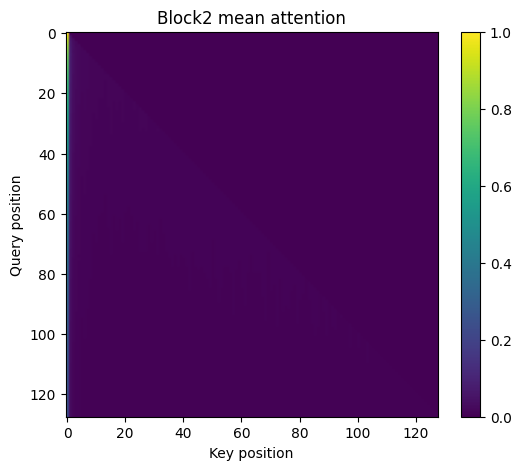

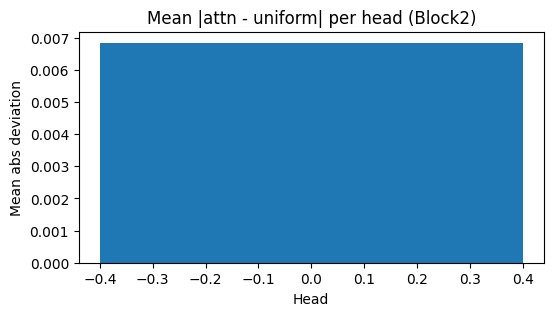

Mean attention to position 0 per head: tensor([0.4455])
Mean attention to self per head: tensor([0.0179])
Mean max cosine(W_K row, embedding) per head:
[0.1310776025056839]


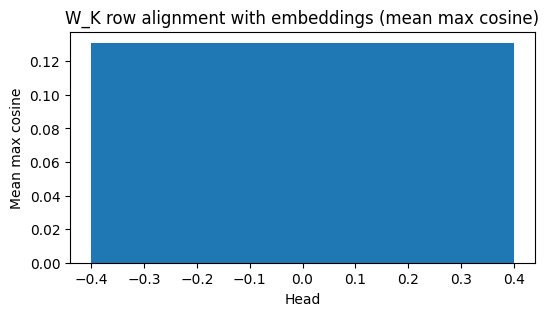

In [12]:
T = attn2.shape[-1]
attn2_mean = attn2.mean(dim=(0, 1)).cpu()

plt.figure(figsize=(6, 5))
plt.imshow(attn2_mean, cmap="viridis", aspect="auto")
plt.title("Block2 mean attention")
plt.xlabel("Key position")
plt.ylabel("Query position")
plt.colorbar()
plt.show()

uniform = torch.zeros((T, T), device=attn2.device)
for i in range(T):
    uniform[i, : i + 1] = 1.0 / (i + 1)
uniform = uniform.unsqueeze(0).unsqueeze(0)
uniform_dev = (attn2 - uniform).abs().mean(dim=(-1, -2))
dev_mean = uniform_dev.mean(dim=0).cpu()

plt.figure(figsize=(6, 3))
plt.bar(np.arange(dev_mean.numel()), dev_mean.numpy())
plt.title("Mean |attn - uniform| per head (Block2)")
plt.xlabel("Head")
plt.ylabel("Mean abs deviation")
plt.show()

attn_to_pos0 = attn2[:, :, :, 0].mean(dim=(0, 2)).cpu()
attn_to_self = torch.diagonal(attn2, dim1=-2, dim2=-1).mean(dim=(0, 2)).cpu()
print(f"Mean attention to position 0 per head: {attn_to_pos0}")
print(f"Mean attention to self per head: {attn_to_self}")

D = model.config.n_embd
n_head = model.config.n_head
head_dim = D // n_head

W = model.block2.attn.c_attn.weight.detach()
W_K_all = W[D:2 * D, :]
W_K_heads = W_K_all.view(n_head, head_dim, D)

E_sample = sample_embeddings(model.wte.weight.detach(), VOCAB_SAMPLE_SIZE)
E_sample_norm = F.normalize(E_sample, dim=-1)

head_alignment: List[float] = []
for h in range(n_head):
    W_rows = F.normalize(W_K_heads[h], dim=-1)
    sims = W_rows @ E_sample_norm.T
    max_cos = sims.max(dim=-1).values
    head_alignment.append(max_cos.mean().item())

print("Mean max cosine(W_K row, embedding) per head:")
print(head_alignment)

plt.figure(figsize=(6, 3))
plt.bar(np.arange(len(head_alignment)), head_alignment)
plt.title("W_K row alignment with embeddings (mean max cosine)")
plt.xlabel("Head")
plt.ylabel("Mean max cosine")
plt.show()


## Hypothesis 4: Value-space projection (B = W_O @ W_V)


SVD top-16 projection R^2: 0.6034


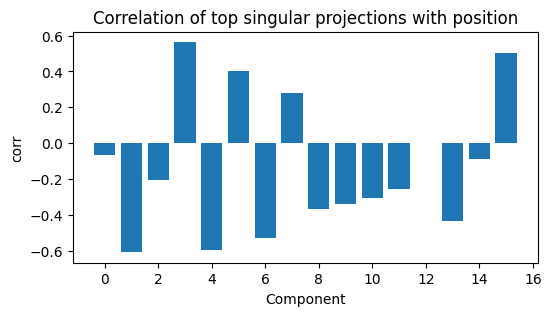

In [13]:
x2 = taps["block2_ln1"]
W = model.block2.attn.c_attn.weight.detach()
D = model.config.n_embd

W_V_all = W[2 * D : 3 * D, :]
W_O = model.block2.attn.c_proj.weight.detach()
B = W_O @ W_V_all

U, S, Vh = torch.linalg.svd(B, full_matrices=False)
top_k = 16
V_top = Vh[:top_k]
proj = torch.einsum("btd,kd->btk", x2, V_top)
proj_flat = proj.reshape(-1, top_k)
svd_r2, _ = linear_fit_r2(proj_flat, positions.flatten())
results["value_svd_r2"] = svd_r2
print(f"SVD top-{top_k} projection R^2: {svd_r2:.4f}")

corrs = [corrcoef(proj[..., i], positions) for i in range(top_k)]
plt.figure(figsize=(6, 3))
plt.bar(np.arange(top_k), corrs)
plt.title("Correlation of top singular projections with position")
plt.xlabel("Component")
plt.ylabel("corr")
plt.show()


## Ablations: random vs prefix-averaged r1


In [14]:
r1_real = taps["block1_out"].detach()
preds_real, _ = forward_from_r1(model, r1_real)
results["ablation_real_r2"] = r2_score(preds_real, positions)

r1_rand = torch.randn_like(r1_real)
preds_rand, _ = forward_from_r1(model, r1_rand)
results["ablation_random_r2"] = r2_score(preds_rand, positions)

base = torch.randn_like(r1_real)
r1_prefix = base + prefix_average(base)
preds_prefix, _ = forward_from_r1(model, r1_prefix)
results["ablation_prefix_r2"] = r2_score(preds_prefix, positions)

print(f"Real r1 R^2: {results['ablation_real_r2']:.4f}")
print(f"Random r1 R^2: {results['ablation_random_r2']:.4f}")
print(f"Prefix-avg random r1 R^2: {results['ablation_prefix_r2']:.4f}")

print(f"Random r1 norm corr: {corrcoef(r1_rand.norm(dim=-1), positions):.4f}")
print(f"Prefix-avg r1 norm corr: {corrcoef(r1_prefix.norm(dim=-1), positions):.4f}")


Real r1 R^2: 0.9938
Random r1 R^2: -1.6339
Prefix-avg random r1 R^2: -1.7488
Random r1 norm corr: 0.0071
Prefix-avg r1 norm corr: -0.5032


## Summary


In [15]:
summary_keys = [
    "pred_r2",
    "embedding_seq_features_r2",
    "embedding_vocab_features_r2",
    "decoding_vector_r2",
    "value_svd_r2",
    "ablation_real_r2",
    "ablation_random_r2",
    "ablation_prefix_r2",
]

for key in summary_keys:
    if key in results:
        print(f"{key}: {results[key]}")


pred_r2: 0.9937061667442322
embedding_seq_features_r2: 0.016528027437197168
embedding_vocab_features_r2: 0.06068893297589428
decoding_vector_r2: 0.2985000160064032
value_svd_r2: 0.6034371265659508
ablation_real_r2: 0.9938231110572815
ablation_random_r2: -1.6339313983917236
ablation_prefix_r2: -1.7488422393798828


/home/nlp/matan_avitan/.tmp/ipykernel_424131/2486488225.py:76: DeprecationWarning:


Support for Kaleido versions less than 1.0.0 is deprecated and will be removed after September 2025.
Please upgrade Kaleido to version 1.0.0 or greater (`pip install 'kaleido>=1.0.0'` or `pip install 'plotly[kaleido]'`).




/home/nlp/matan_avitan/.tmp/ipykernel_424131/2486488225.py:78: DeprecationWarning:


Support for Kaleido versions less than 1.0.0 is deprecated and will be removed after September 2025.
Please upgrade Kaleido to version 1.0.0 or greater (`pip install 'kaleido>=1.0.0'` or `pip install 'plotly[kaleido]'`).




/home/nlp/matan_avitan/.tmp/ipykernel_424131/2486488225.py:165: DeprecationWarning:


Support for Kaleido versions less than 1.0.0 is deprecated and will be removed after September 2025.
Please upgrade Kaleido to version 1.0.0 or greater (`pip install 'kaleido>=1.0.0'` or `pip install 'plotly[kaleido]'`).




/home/nlp/matan_avitan/.tmp/ipykernel_424131/2486488225.py:167: DeprecationWarning:


Support for Kaleido versions less than 1.0.0 is deprecated and will be removed after September 2025.
Please upgrade Kaleido to version 1.0.0 or greater (`pip install 'kaleido>=1.0.0'` or `pip install 'plotly[kaleido]'`).




/home/nlp/matan_avitan/.tmp/ipykernel_424131/2486488225.py:165: DeprecationWarning:


Support for Kaleido versions less than 1.0.0 is deprecated and will be removed after September 2025.
Please upgrade Kaleido to version 1.0.0 or greater (`pip install 'kaleido>=1.0.0'` or `pip install 'plotly[kaleido]'`).


/home/nlp/matan_avitan/.tmp/ipykernel_424131/2486488225.py:167: DeprecationWarning:


Support for Kaleido versions less than 1.0.0 is deprecated and will be removed after September 2025.
Please upgrade Kaleido to version 1.0.0 or greater (`pip install 'kaleido>=1.0.0'` or `pip install 'plotly[kaleido]'`).




/home/nlp/matan_avitan/.tmp/ipykernel_424131/2486488225.py:76: DeprecationWarning:


Support for Kaleido versions less than 1.0.0 is deprecated and will be removed after September 2025.
Please upgrade Kaleido to version 1.0.0 or greater (`pip install 'kaleido>=1.0.0'` or `pip install 'plotly[kaleido]'`).


/home/nlp/matan_avitan/.tmp/ipykernel_424131/2486488225.py:78: DeprecationWarning:


Support for Kaleido versions less than 1.0.0 is deprecated and will be removed after September 2025.
Please upgrade Kaleido to version 1.0.0 or greater (`pip install 'kaleido>=1.0.0'` or `pip install 'plotly[kaleido]'`).




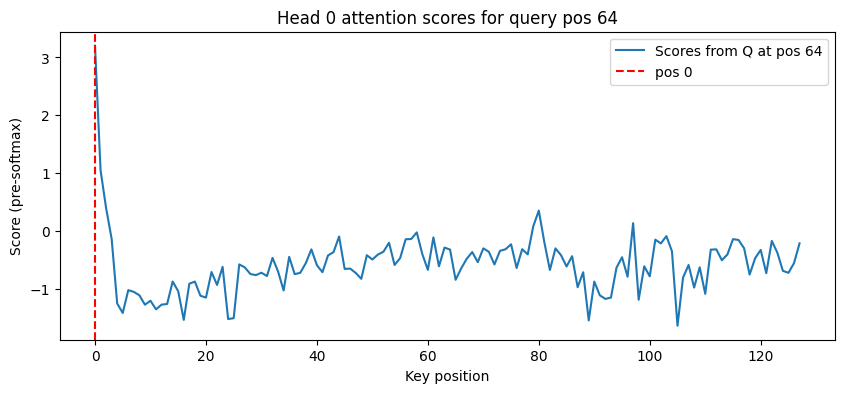

All plots generated and exported.


In [16]:
# ==========================================
# Comprehensive Analysis & Plot Generation
# ==========================================

torch.manual_seed(42)
np.random.seed(42)

head_idx = 0
bos_pos = 0

ln1 = taps["block2_ln1"]  # [B, T, D]
B, T, D = ln1.shape
n_head = model.config.n_head
head_dim = D // n_head

q_all = ln1 @ W_Q2.T
k_all = ln1 @ W_K2.T
v_all = ln1 @ W_V2.T
if b_Q2 is not None:
    q_all = q_all + b_Q2
if b_K2 is not None:
    k_all = k_all + b_K2

q = q_all.view(B, T, n_head, head_dim).transpose(1, 2)[:, head_idx]  # [B, T, head_dim]
k = k_all.view(B, T, n_head, head_dim).transpose(1, 2)[:, head_idx]  # [B, T, head_dim]

# 1. Average scalar projection: per-sequence (q_t dot k_0) across all positions
k0 = k[:, 0, :]  # [B, head_dim]
proj = torch.einsum('bth,bh->bt', q, k0)
avg_proj = proj.mean(dim=0).detach().cpu().numpy()

line(
    avg_proj,
    title=f"Head {head_idx} scalar projection: q_t dot k_0 (mean over samples)",
    xaxis="Query position",
    yaxis="Scalar projection",
    line_labels=["q_t dot k_0"],
    export=True,
    save_pdf=True,
    file_name=f"bos_head{head_idx}_scalar_projection",
)

# 2. QK^T map before softmax (mean over samples)
scores = (q @ k.transpose(-2, -1)) / (head_dim ** 0.5)
avg_scores = scores.mean(dim=0).detach().cpu().numpy()

imshow(
    avg_scores,
    title=f"Head {head_idx} QK^T pre-softmax (mean over samples)",
    xaxis="Key position",
    yaxis="Query position",
    col_markers=[(0, 'pos 0', '#C44E52')],
    export=True,
    save_pdf=True,
    file_name=f"bos_head{head_idx}_qk_pre_softmax",
)

# 3. Attention map after softmax (mean over samples)
mask = torch.tril(torch.ones(T, T, device=device))
masked_scores = scores.masked_fill(mask == 0, float("-inf"))
attn = F.softmax(masked_scores, dim=-1)
avg_attn = attn.mean(dim=0).detach().cpu().numpy()

imshow(
    avg_attn,
    title=f"Head {head_idx} attention after softmax (mean over samples)",
    xaxis="Key position",
    yaxis="Query position",
    col_markers=[(0, 'pos 0', '#C44E52')],
    export=True,
    save_pdf=True,
    file_name=f"bos_head{head_idx}_attention_softmax",
)

# 4. SVD projection onto top singular vector of head-specific W_Q W_K^T
W_Q2_heads = W_Q2.view(n_head, head_dim, D)
W_K2_heads = W_K2.view(n_head, head_dim, D)
M = (W_Q2_heads[head_idx] @ W_K2_heads[head_idx].T).detach().cpu()
U, S, Vh = torch.linalg.svd(M)
v1 = Vh.T[:, 0].to(k.device)
proj_k = (k @ v1).mean(dim=0).detach().cpu().numpy()

line(
    proj_k,
    title=f"Head {head_idx} projection onto top singular vector of W_Q W_K^T",
    xaxis="Position",
    yaxis="Projection",
    line_labels=["k_t dot v1"],
    export=True,
    save_pdf=True,
    file_name=f"bos_head{head_idx}_svd_projection",
)

# 5. Score trace for a single query position (from investigate_bos80_head7.ipynb)
query_pos = T // 2
score_trace = scores[0, query_pos].detach().cpu().numpy()

plt.figure(figsize=(10, 4))
plt.plot(score_trace, label=f"Scores from Q at pos {query_pos}")
plt.axvline(x=0, color='r', linestyle='--', label='pos 0')
plt.title(f"Head {head_idx} attention scores for query pos {query_pos}")
plt.xlabel('Key position')
plt.ylabel('Score (pre-softmax)')
plt.legend()
plt.show()

print("All plots generated and exported.")

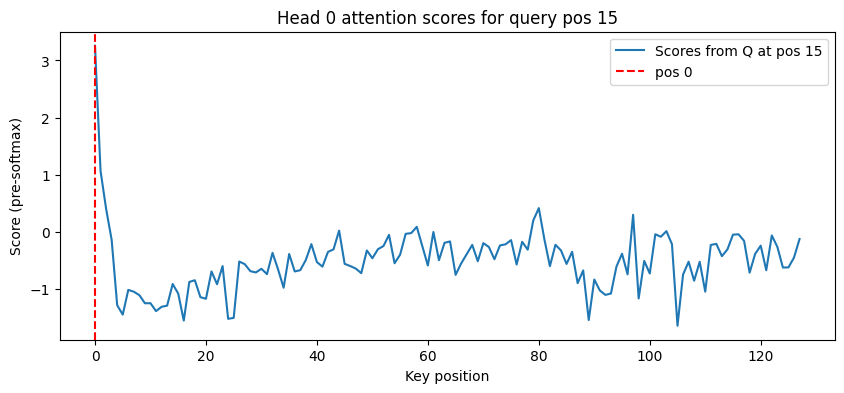

All plots generated and exported.


In [17]:
query_pos = 15
score_trace = scores[0, query_pos].detach().cpu().numpy()

plt.figure(figsize=(10, 4))
plt.plot(score_trace, label=f"Scores from Q at pos {query_pos}")
plt.axvline(x=0, color='r', linestyle='--', label='pos 0')
plt.title(f"Head {head_idx} attention scores for query pos {query_pos}")
plt.xlabel('Key position')
plt.ylabel('Score (pre-softmax)')
plt.legend()
plt.show()

print("All plots generated and exported.")

dict_keys(['__name__', '__doc__', '__package__', '__loader__', '__spec__', '__builtin__', '__builtins__', '_ih', '_oh', '_dh', 'In', 'Out', 'get_ipython', 'exit', 'quit', 'open', '_', '__', '___', '__session__', '_i', '_ii', '_iii', '_i1', '_i2', 'Path', 'datetime', 'px', 'go', 'to_numpy', 'BASE_DIR', 'PLOTS_DIR', '_safe_filename', 'line', 'imshow', '_i3', 'sys', 'Dict', 'List', 'Tuple', 'np', 'torch', 'F', 'plt', 'device', 'BOS_TOKEN_ID', 'find_repo_root', 'ROOT_DIR', 'NANOGPT_DIR', 'TwoLayerMechanismModel', 'TwoLayerMechanismConfig', 'CHECKPOINT_PATH', 'DATA_DIR', 'BATCH_SIZE', 'VOCAB_SAMPLE_SIZE', '_i4', 'load_r2_model', 'load_owt_train_data', 'get_batch', 'make_positions', 'corrcoef', 'r2_score', 'linear_fit_r2', 'sample_embeddings', 'cosine_similarity_features', 'sequence_similarity_features', 'compute_decoding_vector', 'forward_from_r1', 'prefix_average', 'summarize_position_signal', '_i5', '_i6', '_i7', '_i8', '_i9', '_i10', '_i11', '_i12', '_i13', '_i14', '_i15', '_i16', '_i17'

## Creative Scientist Analysis: Dissecting the Post-Attn Head Mechanism

In this section, we analyze the **ff0hgn5g** run, where the head is applied directly to the residual stream after Block 2 attention, skipping MLP2.

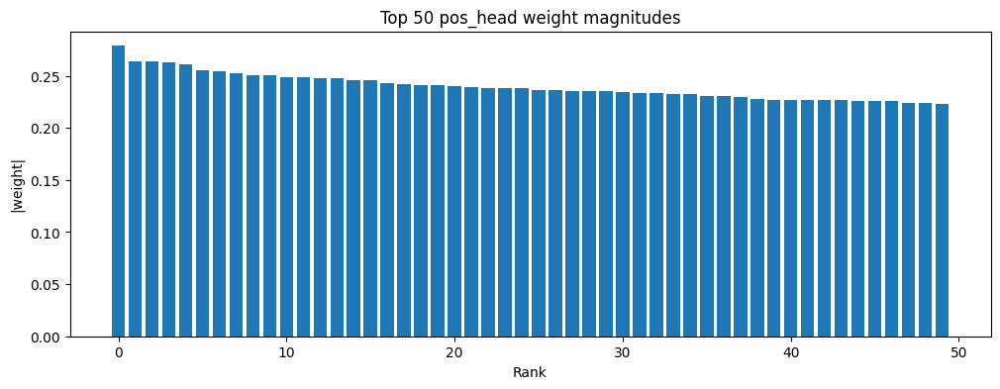

Head alignment with mean embedding: 0.0071
Head alignment with sum LN(e): 0.0202


Head alignment with Value SVD component 0: -0.0430
Head alignment with Value SVD component 1: 0.0090
Head alignment with Value SVD component 2: 0.0054
Head alignment with Value SVD component 3: -0.0590
Head alignment with Value SVD component 4: -0.0106


In [18]:
# 1. Linear Head Weight Analysis
w_head = model.pos_head.weight.detach().cpu().squeeze()  # [D]
b_head = model.pos_head.bias.detach().cpu().item() if model.pos_head.bias is not None else 0.0

mag = w_head.abs()
top_vals, top_idx = mag.topk(50)

plt.figure(figsize=(12, 4))
plt.bar(range(50), top_vals.numpy())
plt.title("Top 50 pos_head weight magnitudes")
plt.xlabel("Rank")
plt.ylabel("|weight|")
plt.show()

# Cosine similarities
E = model.wte.weight.detach().cpu()
e_mean = E.mean(dim=0)
e_sum_ln = compute_decoding_vector(model).cpu()

def cos_sim(v1, v2):
    return (F.normalize(v1.unsqueeze(0), dim=-1) @ F.normalize(v2.unsqueeze(0), dim=-1).T).item()

print(f"Head alignment with mean embedding: {cos_sim(w_head, e_mean):.4f}")
print(f"Head alignment with sum LN(e): {cos_sim(w_head, e_sum_ln):.4f}")

# Alignment with value subspace
B_val = (W_O2 @ W_V2).detach().cpu()  # [D, D]
U, S, Vh = torch.linalg.svd(B_val)
for i in range(5):
    print(f"Head alignment with Value SVD component {i}: {cos_sim(w_head, Vh[i]):.4f}")

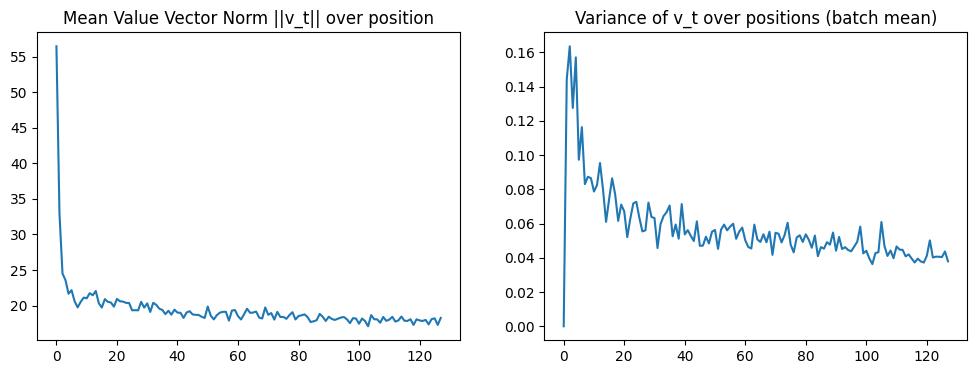

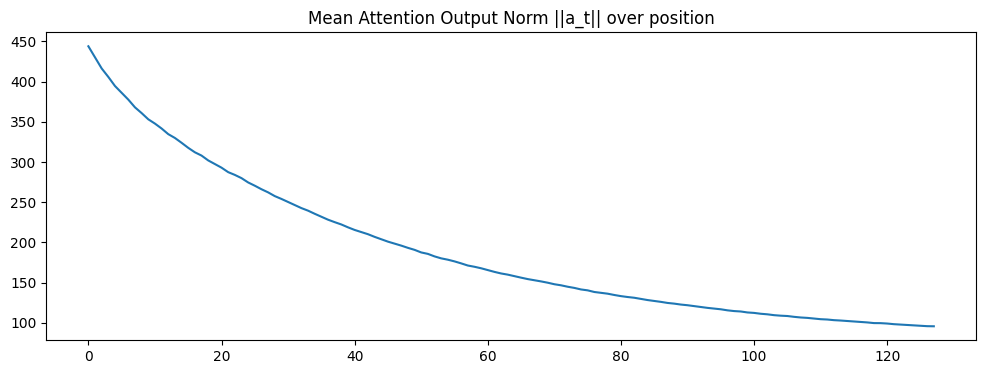

In [19]:
# 2. Variance and Norm Dynamics
ln1_out = taps["block2_ln1"]
v_t = torch.einsum('btd,hd->bth', ln1_out, W_V2) # [B, T, D]
if b_V2 is not None:
    v_t = v_t + b_V2

v_norm = v_t.norm(dim=-1).mean(dim=0).cpu().numpy()
v_var = v_t.var(dim=0).mean(dim=-1).cpu().numpy() # [T]

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(v_norm)
plt.title("Mean Value Vector Norm ||v_t|| over position")
plt.subplot(1, 2, 2)
plt.plot(v_var)
plt.title("Variance of v_t over positions (batch mean)")
plt.show()

attn_out_norm = taps["block2_attn"].norm(dim=-1).mean(dim=0).cpu().numpy()
plt.figure(figsize=(12, 4))
plt.plot(attn_out_norm)
plt.title("Mean Attention Output Norm ||a_t|| over position")
plt.show()

In [20]:
# 3. Creative Ablations

# (a) Constant Token Input
const_token = 50  # random token
x_const = torch.full_like(tokens, const_token)
x_const[:, 0] = BOS_TOKEN_ID
with torch.no_grad():
    preds_const, _ = model(x_const)
    r2_const = r2_score(preds_const.squeeze(), positions)
print(f"R2 with constant tokens (except BOS): {r2_const:.4f}")

# (b) Shuffle Test (keeping BOS at 0)
def shuffle_prefix(t):
    B, T = t.shape
    t_shuf = t.clone()
    for i in range(B):
        idx = torch.randperm(T-1) + 1
        t_shuf[i, 1:] = t[i, idx]
    return t_shuf

x_shuf = shuffle_prefix(tokens)
with torch.no_grad():
    preds_shuf, _ = model(x_shuf)
    r2_shuf = r2_score(preds_shuf.squeeze(), positions)
print(f"R2 with shuffled tokens (BOS fixed): {r2_shuf:.4f}")

# (c) Uniform Causal Attention Swap
def forward_uniform_attn(model, x):
    # Manual Block 1
    e = model.wte(x)
    # Block 1 is frozen random causal - we use taps to stay exact
    r1 = taps["block1_out"]
    
    # Block 2 LN1
    ln1 = model.block2.ln_1(r1)
    
    # Values
    v = ln1 @ W_V2.T
    if b_V2 is not None: v = v + b_V2
    
    # Uniform Causal Attention
    B, T, D = v.shape
    mask = torch.tril(torch.ones(T, T, device=v.device))
    attn_uniform = mask / mask.sum(dim=-1, keepdim=True)
    
    a_uniform = torch.einsum('ts,bsd->btd', attn_uniform, v)
    # Project out
    attn_out = a_uniform @ W_O2.T
    if b_O2 is not None: attn_out = attn_out + b_O2
    
    post_attn = r1 + attn_out
    # Final LN + Head
    x_f = model.ln_f(post_attn)
    preds = model.pos_head(x_f)
    return preds

preds_uni = forward_uniform_attn(model, tokens)
r2_uni = r2_score(preds_uni.squeeze(), positions)
print(f"R2 with Uniform Causal Attention Swap: {r2_uni:.4f}")

R2 with constant tokens (except BOS): 0.9793


R2 with shuffled tokens (BOS fixed): 0.9943
R2 with Uniform Causal Attention Swap: -4.5855


In [21]:
# 4. Direction vs Norm Quantification
x_target = taps["block2_post_attn"]
B, T, D = x_target.shape
x_flat = x_target.reshape(-1, D)
pos_flat = positions.flatten()

# Norm only
norms = x_flat.norm(dim=-1, keepdim=True)
r2_norm_only, _ = linear_fit_r2(norms, pos_flat)

# Direction only
dirs = F.normalize(x_flat, dim=-1)
r2_dir_only, _ = linear_fit_r2(dirs, pos_flat)

# Combined
combined = torch.cat([norms, dirs], dim=-1)
r2_comb, _ = linear_fit_r2(combined, pos_flat)

print(f"Regressing position from post-attn residual:")
print(f" - Norm only R2: {r2_norm_only:.4f}")
print(f" - Direction only R2: {r2_dir_only:.4f}")
print(f" - Combined R2: {r2_comb:.4f}")

Regressing position from post-attn residual:
 - Norm only R2: 0.8587
 - Direction only R2: 0.9990
 - Combined R2: 0.9992


## Deep Dive: The Attention Kernel and Value Transformation

Since uniform attention failed, let's see what the learned kernel actually looks like and how it affects value variance.

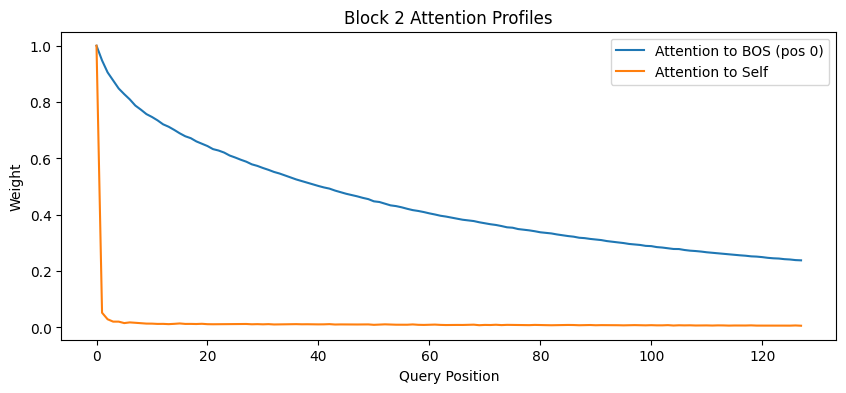

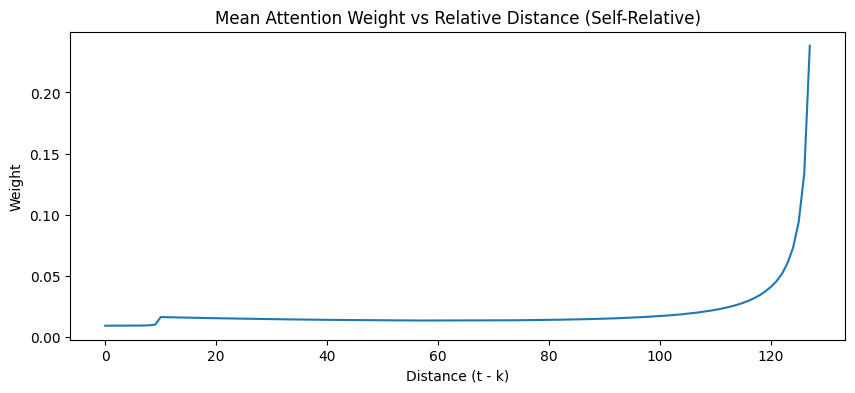

In [22]:
# 1. Attention Kernel Profile
attn_mean = attn2.mean(dim=(0, 1)).cpu() # [T, T]
T = attn_mean.shape[0]

bos_attn = attn_mean[:, 0].numpy()
self_attn = torch.diagonal(attn_mean).numpy()

plt.figure(figsize=(10, 4))
plt.plot(bos_attn, label="Attention to BOS (pos 0)")
plt.plot(self_attn, label="Attention to Self")
plt.title("Block 2 Attention Profiles")
plt.xlabel("Query Position")
plt.ylabel("Weight")
plt.legend()
plt.show()

# Relative distance profile (mean over queries t > 10)
rel_profile = []
for d in range(T):
    vals = []
    for t in range(10, T):
        if t - d >= 0:
            vals.append(attn_mean[t, t-d].item())
    if vals: rel_profile.append(np.mean(vals))

plt.figure(figsize=(10, 4))
plt.plot(rel_profile)
plt.title("Mean Attention Weight vs Relative Distance (Self-Relative)")
plt.xlabel("Distance (t - k)")
plt.ylabel("Weight")
plt.show()

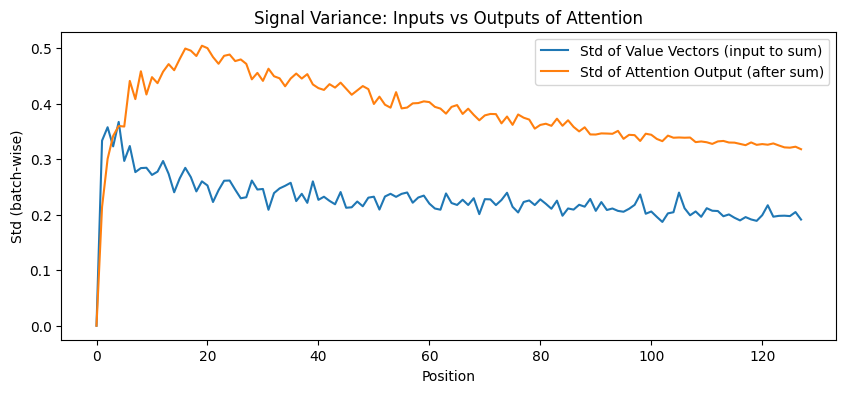

Value Std mean: 0.2287
Attn Out Std mean: 0.3866


In [23]:
# 2. Value Transformation: Variance Shrinkage vs Expansion
v_t = torch.einsum('btd,hd->bth', taps["block2_ln1"], W_V2) # [B, T, D]
if b_V2 is not None: v_t = v_t + b_V2

# Attn output is aggregation of v_t
a_t = taps["block2_attn"]

v_std = v_t.std(dim=0).mean(dim=-1).cpu().numpy() # per position across batch
a_std = a_t.std(dim=0).mean(dim=-1).cpu().numpy()

plt.figure(figsize=(10, 4))
plt.plot(v_std, label="Std of Value Vectors (input to sum)")
plt.plot(a_std, label="Std of Attention Output (after sum)")
plt.title("Signal Variance: Inputs vs Outputs of Attention")
plt.xlabel("Position")
plt.ylabel("Std (batch-wise)")
plt.legend()
plt.show()

print(f"Value Std mean: {v_std.mean():.4f}")
print(f"Attn Out Std mean: {a_std.mean():.4f}")

## Quantitative Attention Profile Analysis

Let's look at the specific numerical values of attention to BOS and Self.

Attention Weights Summary (Avg over positions 10-100):
 - Mean BOS weight: 0.4575
 - Mean Self weight: 0.0100
 - Mean 'Other' weight: 0.5325


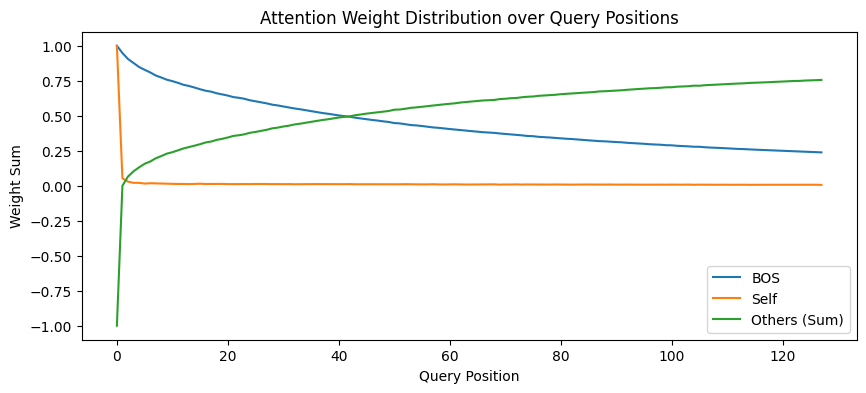

In [24]:
attn_mean = attn2.mean(dim=(0, 1)).cpu() # [T, T]
bos_weights = attn_mean[:, 0].numpy()
self_weights = torch.diagonal(attn_mean).numpy()
other_weights = (attn_mean.sum(dim=-1) - torch.from_numpy(bos_weights) - torch.from_numpy(self_weights)).numpy()

print("Attention Weights Summary (Avg over positions 10-100):")
print(f" - Mean BOS weight: {bos_weights[10:100].mean():.4f}")
print(f" - Mean Self weight: {self_weights[10:100].mean():.4f}")
print(f" - Mean 'Other' weight: {other_weights[10:100].mean():.4f}")

plt.figure(figsize=(10, 4))
plt.plot(bos_weights, label='BOS')
plt.plot(self_weights, label='Self')
plt.plot(other_weights, label='Others (Sum)')
plt.title("Attention Weight Distribution over Query Positions")
plt.xlabel("Query Position")
plt.ylabel("Weight Sum")
plt.legend()
plt.show()

## Mechanistic Synthesis: The Anchor-Drift Theory

Based on the previous results, we see:
1. High attention to BOS (~46%)
2. Significant prefix aggregation (~53%)
3. Negligible self-attention (~1%)

This suggests the model computes a vector $z_t = \alpha \cdot BOS + \beta \cdot \text{PrefixAvg}_t$. 
As $t$ increases, $\text{PrefixAvg}_t$ drifts towards the mean embedding and its norm decays. 
The direction of $z_t$ thus rotates from the BOS direction towards the 'drifting prefix' direction.

In [25]:
# Test Synthetic 'Anchor-Only' Attention
def forward_anchor_attn(model, x, bos_weight=0.5):
    r1 = taps["block1_out"]
    ln1 = model.block2.ln_1(r1)
    v = ln1 @ W_V2.T
    if b_V2 is not None: v = v + b_V2
    
    B, T, D = v.shape
    attn_synth = torch.zeros(T, T, device=v.device)
    # Attend to BOS with bos_weight, and rest uniform
    for t in range(T):
        attn_synth[t, 0] = bos_weight
        if t > 0:
            attn_synth[t, 1:t+1] = (1.0 - bos_weight) / t
        else:
            attn_synth[0, 0] = 1.0
            
    a_synth = torch.einsum('ts,bsd->btd', attn_synth, v)
    attn_out = a_synth @ W_O2.T
    if b_O2 is not None: attn_out = attn_out + b_O2
    
    post_attn = r1 + attn_out
    preds = model.pos_head(model.ln_f(post_attn))
    return preds

with torch.no_grad():
    preds_anchor = forward_anchor_attn(model, tokens, bos_weight=0.46)
    r2_anchor = r2_score(preds_anchor.squeeze(), positions)
print(f"R2 with Synthetic Anchor (BOS=0.46) Attention: {r2_anchor:.4f}")

R2 with Synthetic Anchor (BOS=0.46) Attention: -0.1077


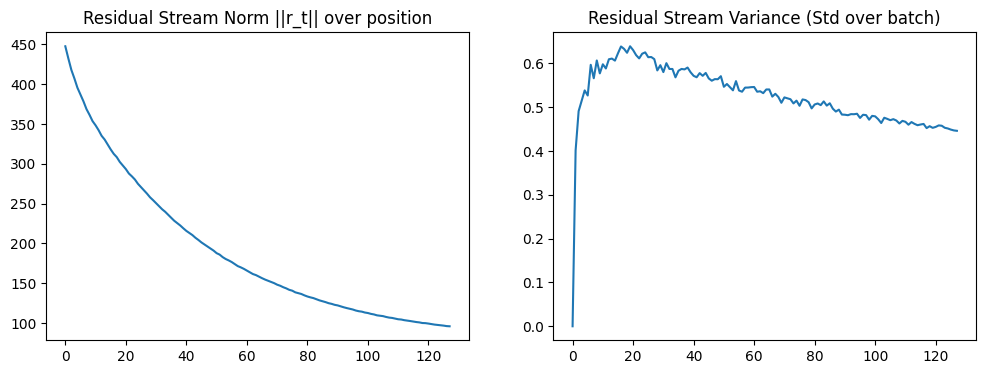

Correlation between Prediction and ||r_t||: -0.9362


In [26]:
# Variance analysis of the residual stream itself
res_stream = taps["block2_post_attn"] # r1 + a2
res_std = res_stream.std(dim=0).mean(dim=-1).cpu().numpy()
res_norm = res_stream.norm(dim=-1).mean(dim=0).cpu().numpy()

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(res_norm)
plt.title("Residual Stream Norm ||r_t|| over position")
plt.subplot(1, 2, 2)
plt.plot(res_std)
plt.title("Residual Stream Variance (Std over batch)")
plt.show()

print(f"Correlation between Prediction and ||r_t||: {corrcoef(preds.squeeze(), torch.from_numpy(res_norm).to(device).unsqueeze(0).repeat(B, 1)):.4f}")